# SARSA

- Init `Q`
- Repeat an episode
  - For each step:
    - get an action from the policy(`Q`, `epsilon`)
    - get a next state and the reward
    - get a next action from the policy(`Q`, `epsilon`)
    - udpate `Q` with SARSA algorithm
    - go to the next state
  - The current episode ends when the goal state is found.

In [1]:
%matplotlib inline
import math
from IPython.display import HTML
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as lines
from matplotlib import animation
from scipy.special import softmax

np.random.seed(0)

In [2]:
WIDTH = 6
HEIGHT = 5
N = WIDTH * HEIGHT
LAST_STATE = N - 1
WALLS = ((1,0),(1,2),(1,4),(2,3),(3,1),(4,3),(5,3),(5,1))

def state2coord(state):
    y, x = divmod(state, WIDTH)
    return x, y

def coord2state(x, y):
    return y * WIDTH + x

def theta2q(theta):
    return softmax(np.nan_to_num(theta, nan=np.finfo(np.float64).min), axis=1)

wall_set = set((coord2state(x, y) for x, y in WALLS))

ACTION_LEFT = 0
ACTION_RIGHT = 1
ACTION_UP = 2
ACTION_DOWN = 3

TRY_TO_MOVE_TOWARD_WALL = True

In [3]:
def get_uniform_q():
    if TRY_TO_MOVE_TOWARD_WALL:
        q = np.ones((N,4))
    else:
        q = np.empty((N,4))
        q[:] = np.nan

    for x in range(WIDTH):
        for y in range(HEIGHT):
            state = coord2state(x, y)
            if state in wall_set:
                continue
            if x > 0:
                left = coord2state(x - 1, y)
                if left not in wall_set:
                    q[state, ACTION_LEFT] = 1
            if x < WIDTH - 1:
                right = coord2state(x + 1, y)
                if right not in wall_set:
                    q[state, ACTION_RIGHT] = 1
            if y > 0:
                down = coord2state(x, y - 1)
                if down not in wall_set:
                    q[state, ACTION_DOWN] = 1
            if y < HEIGHT - 1:
                up = coord2state(x, y + 1)
                if up not in wall_set:
                    q[state, ACTION_UP] = 1
    return q

uniform_q = get_uniform_q()
initial_q = np.random.rand(N, 4) * uniform_q

In [4]:
def get_action(q, state, epsilon):
    if np.random.rand() < epsilon:
        ret = np.random.choice(4)
    else:
        ret = np.argmax(q[state,:])
    return ret

def get_next_state(state, action):
    x, y = state2coord(state)
    if action == ACTION_LEFT:
        x -= 1
    elif action == ACTION_RIGHT:
        x += 1
    elif action == ACTION_UP:
        y += 1
    elif action == ACTION_DOWN:
        y -= 1
    new_state = coord2state(x, y)
    
    if new_state in wall_set or x < 0 or y < 0 or x >= WIDTH or y >= HEIGHT:
        return state
    
    return new_state

def run(q, epsilon):
    state_history = [] # keep states
    action_history = [] # keep actions

    state = 0
    state_history.append(state)
    action = get_action(q, state, epsilon)
    action_history.append(action)

    for i in range(100000):
        next_state = get_next_state(state, action)
        state_history.append(next_state)

        if next_state == LAST_STATE:
            reward = 1
            next_action = None
        else:
            reward = 0
            next_action = get_action(q, next_state, epsilon)
            action_history.append(action)
            
        q = get_updated_q_by_sarsa(state, action, reward, next_state, next_action, q)
            
        if next_state == LAST_STATE:
            return q, state_history, action_history
        else:
            state = next_state
            action = next_action
    
    print(np.unique(state_history))
    print(np.unique(action_history))
    raise Exception("Infinite loop encountered!")

def get_updated_q_by_sarsa(state, action, reward, next_state, next_action, q, eta=0.1, gamma=0.9):
    q_updated = q.copy()
    
    if next_state == LAST_STATE:
        q[state, action] = q[state, action] + eta * (reward - q[state, action])
    else:
        q[state, action] = q[state, action] + eta * (reward + gamma*q[next_state, next_action] - q[state, action])

    return q

def train(q):
    epsilon = 0.5
    all_state_history = []
    n_iterations = 1000

    # epsilon goes to 1/100 * epsilon during n_iterations
    decay = math.e ** (-2 * math.log(10) / (n_iterations - 1))
    print(f"decay={decay}")

    for i in range(n_iterations):
        q, state_history, action_history = run(q, epsilon)
        all_state_history.append(state_history)
        if i < n_iterations - 1:
            epsilon *= decay
        
    print(f"epsilon={epsilon}")
    print(f"q={q}")

    return all_state_history

all_state_history = train(initial_q)

decay=0.9954008287621523
epsilon=0.005000000000000224
q=[[0.26155626 0.24086668 0.42579561 0.27579268]
 [0.4236548  0.64589411 0.43758721 0.891773  ]
 [0.27683879 0.28022115 0.44863858 0.28272989]
 [0.29157096 0.29407231 0.28632206 0.2665384 ]
 [0.29739923 0.29834102 0.29765464 0.29374207]
 [0.29765005 0.29728742 0.29656422 0.30033891]
 [0.29168996 0.47260736 0.24023528 0.27565809]
 [0.3296892  0.52332099 0.38694182 0.35692939]
 [0.37039579 0.40303912 0.57919643 0.33409011]
 [0.61209572 0.616934   0.94374808 0.6818203 ]
 [0.29820887 0.30382586 0.33209622 0.30326162]
 [0.66676672 0.67063787 0.21038256 0.1289263 ]
 [0.21476858 0.21340676 0.21291448 0.32401739]
 [0.98837384 0.10204481 0.20887676 0.16130952]
 [0.52535044 0.64311982 0.48508943 0.39159859]
 [0.50356325 0.40119097 0.71860506 0.54450992]
 [0.55580188 0.31559905 0.3171096  0.26451914]
 [0.31958608 0.3138866  0.31252343 0.31659875]
 [0.21390636 0.2140777  0.2126505  0.21722453]
 [0.21925341 0.20049001 0.22074533 0.18920754]
 [0.

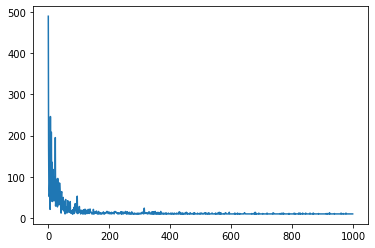

In [5]:
plt.plot(
    tuple(range(len(all_state_history))),
    tuple(len(h) for h in all_state_history)
)
plt.show()

In [6]:
def draw(width, height, walls=None, coord=None):
    
    figure = plt.figure(figsize=(width + 2, height + 2))
    ax = plt.gca()

    if walls is not None:
        for w in walls:
            ax.plot(w[0],w[1], marker='s', color='gray', markersize=73)

    for x in range(width):
        for y in range(height):
            plt.text(x, y, f'S{coord2state(x, y)}', size=14, ha='center')

    ax.set_xlim(-0.5, width - 0.5)
    ax.set_ylim(-0.5, height - 0.5)

    plt.tick_params(
        axis='both',
        which='both',
        bottom=False,
        top=False,
        labelbottom=False,
        right=False,
        left=False,
        labelleft=False
    )
    
    if coord is not None:
        marker, = ax.plot(coord[0], coord[1], marker="o", color='g', markersize=60)
        return marker, figure

In [7]:
def create_animation(state_history):
    marker, figure = draw(WIDTH, HEIGHT, WALLS, state2coord(0))
    def init():
        return marker,

    def animate(i):
        marker.set_data(state2coord(state_history[i]))
        return marker,

    anim = animation.FuncAnimation(figure, animate, init_func=init, frames=len(state_history), interval=200, repeat=False)
    plt.close()
    return anim

def display_as_animation(state_history):
    print(len(state_history))
    anim = create_animation(state_history)
    return HTML(anim.to_jshtml())

In [8]:
display_as_animation(all_state_history[0])

489


In [9]:
display_as_animation(all_state_history[-1])

10
